# Redes Neurais Convolucionais (CNN)


`Redes Neurais Convolucionais` podem ser utilizadas para descobrir padrões contidos em uma imagem. 

Tradicionalmente uma `CNN` é composta por um conjunto de camadas de `Convolução + Ativação + Pooling`, seguida de uma `Camada Completamente Conectada` que funciona como uma função de distribuição de probabilidades.


As CNN são bastante utilizadas em 2 tipos de problemas:
- Classificação de imagens
- Segmentação de imagens

<img src='images/cnn_padrao.png' />


### Exemplificando o `Filtro Convolucional`: 
<img src='images/conv-full-layer.gif'/>

### Exemplificando a `Função de Ativação ReLU`: 
<img src='images/relu.jpeg'/>

### Exemplificando o `Filtro Max Pooling`:
<img src='images/maxpool_animation.gif'/>

### Exemplificando a classificação de uma imagem:
<img src='images/cnn.gif'/>


- https://towardsdatascience.com/review-fcn-semantic-segmentation-eb8c9b50d2d1
- https://www.guru99.com/convnet-tensorflow-image-classification.html
- https://medium.com/x8-the-ai-community/cnn-9c5e63703c3f
- https://compsci682.github.io/notes/convolutional-networks/
 
- http://setosa.io/ev/image-kernels/
- https://towardsdatascience.com/intuitively-understanding-convolutions-for-deep-learning-1f6f42faee1


# Algumas redes famosas

- [LeNet](http://yann.lecun.com/exdb/publis/pdf/lecun-98.pdf) - A primeira aplicação bem sucessida de uma CNN foi desenvolvida por Yann LeCun em 1998.

- [AlexNet](http://papers.nips.cc/paper/4824-imagenet-classification-with-deep-convolutional-neural-networks.pdf) - Esse foi o primeiro trabalho que popularizou a utilização de CNN na área de visão computacional.

- [VGGNet](http://www.robots.ox.ac.uk/~vgg/research/very_deep/) - 

- [ResNet](https://arxiv.org/pdf/1512.03385.pdf) - 

- [U-Net](https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/) - 

# Temas de otimização

- Data Augmentation
- Transfer Learning
- Visualizing what ConvNets learn

# Definindo o modelo CNN 

<img src='images/vgg16.png' width=60% />

In [12]:
import torch
import torch.nn as nn
import torch.nn.functional as F
  
# Definindo a CNN
class Net(nn.Module):
    
    def __init__(self, n_classes=4):
        super(Net, self).__init__()
        
        # Define as camadas (VGG16)
        # Camada convolucional: https://pytorch.org/docs/stable/nn.html#conv2d
        # Camada de max pooling: https://pytorch.org/docs/stable/nn.html#maxpool2d
        
        self.features = nn.Sequential(
            
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0),
            
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0),
            
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0),
            
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0),
            
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0),
            
        )
        
        self.classifier = nn.Sequential(
            
            nn.Linear(7*7*512, 4096),
            nn.ReLU(True),
            nn.Dropout(0.5),
            
            nn.Linear(4096, 4096),
            nn.ReLU(True),
            nn.Dropout(0.5),
            
            nn.Linear(4096, n_classes)
        )        

    def forward(self, x):
                
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        
        return x;
        
        # retorna todas as saidas separadamente
        # return torch.squeeze(self.conv1.weight).detach().numpy(), conv_x, activated_x, pooled_x, x
    
# instancia o modelo criado
model = Net()
# mostra as camadas do modelo criado
print(model)

Net(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (17): Conv2d

# Definindo a função de perda e a taxa de aprendizado

In [13]:
import torch.optim as optim

def loss_function():
    
    # specify the loss function (categorical cross-entropy) for optimization
    criterion = nn.CrossEntropyLoss()
    
    # specify optimizer (stochastic gradient descent) and learning rate = 0.001
    optimizer = optim.SGD(model.parameters(), lr=0.001)
    
    return criterion, optimizer

# Definindo o dataset

In [26]:
import os, os.path, random
import torchvision.transforms as transforms
import torchvision.datasets as datasets

batch_size = 10

# All images are resized to 224 x 224 and normalized
# Only training images receive further augmentation
dataset_transforms = {
    'all': transforms.Compose([
        transforms.Resize(size=(224, 224)),
        #transforms.RandomResizedCrop(224),
        transforms.ToTensor()
        #transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)) # normaliza os pixels para 0..1
        #transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ]),
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.ToTensor()
    ]),
    'test': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.ToTensor()
    ]),    
}

dataset_dir = "datasets/animais"
image_datasets = {x: datasets.ImageFolder(os.path.join(dataset_dir, x), dataset_transforms[x]) for x in ['train', 'test', 'all']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=batch_size, shuffle=False if x == 'all' else True, num_workers=4) for x in ['train', 'test', 'all']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'test', 'all']}

class_names = image_datasets['train'].classes
n_classes = len(class_names)

print(f"Qtd de total de imagens: {dataset_sizes['all']}")
print(f"Qtd de imagens de treinamento: {dataset_sizes['train']}")
print(f"Qtd de imagens de teste: {dataset_sizes['test']}")
print(f"Classes: {class_names}")

Qtd de total de imagens: 60
Qtd de imagens de treinamento: 52
Qtd de imagens de teste: 8
Classes: ['cavalo', 'gato', 'pedrita', 'peixe']


# Exibe o dataset

In [15]:
import matplotlib.pyplot as plt
%matplotlib inline

import numpy as np

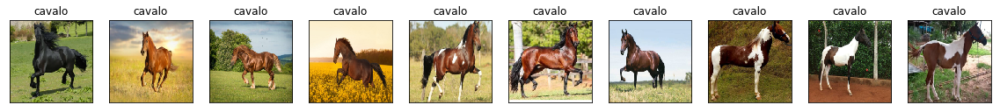

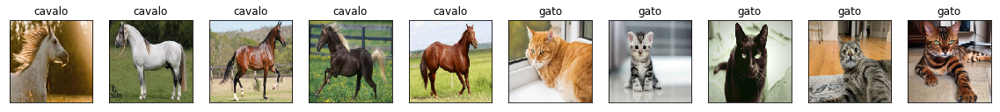

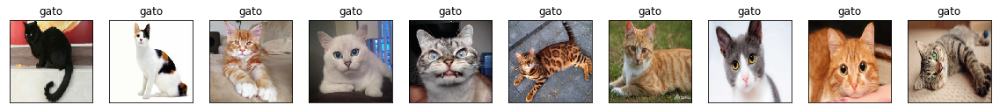

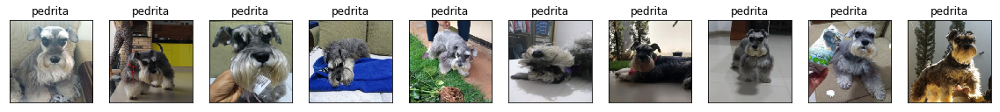

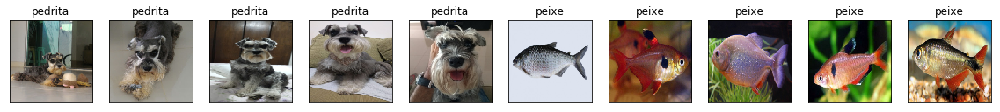

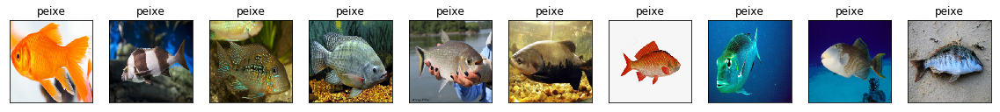

In [33]:
def show_dataset_batch(data, target, last_row=0):
    images = data.numpy()     
    for idx in np.arange(len(images)):
        img = images[idx] #/ 2 + 0.5
        row = int(np.floor(idx/10)) +last_row        
        if (idx % 10 == 0):
            fig = plt.figure(figsize=(20, 20))

        ax = fig.add_subplot(1, 10, (idx-(int(np.floor(idx/10))*10)+1) if idx >= 10 else idx +1, xticks=[], yticks=[])
        ax.imshow(np.transpose(img, (1, 2, 0)))
        ax.set_title(class_names[target[idx]])

    last_row += int(np.floor(len(images)/10))
    
    
def show_dataset(dataloader):
    
    rows = int(np.ceil(dataset_sizes['all']/10.0))
    cols = 10

    for data, target in dataloader:
        show_dataset_batch(data, target)
        
show_dataset(dataloaders['all'])

# Treinando a rede

In [28]:
import time
    
def train_cnn(augmentation_times=1):

    # numero de epocas para treinar o modelo
    n_epochs = 1
    train_loss_min = np.Inf

    criterion, optimizer = loss_function()

    since = time.time()
    for epoch in range(1, n_epochs+1):

        print("")
        print('Epoch {}/{}'.format(epoch, n_epochs))
        print('-' * 10)

        # keep track of training and validation loss
        train_loss = 0.0

        ###################
        # train the model #
        ###################
        model.train()
        for i in range(augmentation_times):
            for batch_i, (data, target) in enumerate(dataloaders['train']):

                print(f"Processando {batch_i+1}º lote de {len(data)} imagens (total = {dataset_sizes['train']})...")

                # clear the gradients of all optimized variables
                optimizer.zero_grad()

                # forward pass: compute predicted outputs by passing inputs to the model
                output = model(data)

                # calculate the loss
                loss = criterion(output, target)

                # backward pass: compute gradient of the loss with respect to model parameters
                loss.backward()

                # perform a single optimization step (parameter update for all the weights of the network)
                optimizer.step()

                # update training loss 
                train_loss += loss.item()

        # calculate average loss
        train_loss = train_loss/len(dataloaders['train'].dataset)

        # estatisticas de treinamento
        print('Epoch: {} \tTraining Loss: {:.6f}'.format(epoch, train_loss))

        # salva o melhor modelo
        #if train_loss <= train_loss_min:
        #    print('Train loss diminuiu ({:.6f} --> {:.6f}). Salvando modelo ...'.format(train_loss_min, train_loss))
        #    torch.save(model.state_dict(), 'model.pt')
        #    train_loss_min = train_loss

    time_elapsed = time.time() - since
    print('Treinamento realizado em {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))    

In [29]:
model = Net()
train_cnn()


Epoch 1/1
----------
Processando 1º lote de 10 imagens (total = 52)...
Processando 2º lote de 10 imagens (total = 52)...
Processando 3º lote de 10 imagens (total = 52)...
Processando 4º lote de 10 imagens (total = 52)...
Processando 5º lote de 10 imagens (total = 52)...
Processando 6º lote de 2 imagens (total = 52)...
Epoch: 1 	Training Loss: 0.160009
Treinamento realizado em 2m 10s


In [9]:
# carrega o modelo de melhor resultado no treinamento
model.load_state_dict(torch.load('model.pt'))

# Verificando a acurácia da rede treinada

In [30]:
# track test loss
test_loss = 0.0
class_correct = list(0. for i in range(10))
class_total = list(0. for i in range(10))

criterion, optimizer = loss_function()
    
model.eval()
# iterate over test data
for data, target in dataloaders['test']:
    
    # forward pass: compute predicted outputs by passing inputs to the model
    output = model(data)
    
    # calculate the batch loss
    loss = criterion(output, target)
    
    # update test loss 
    test_loss += loss.item()*data.size(0)
    
    # convert output probabilities to predicted class
    _, pred = torch.max(output, 1)    
    
    # compare predictions to true label
    correct_tensor = pred.eq(target.data.view_as(pred))
    correct = np.squeeze(correct_tensor.numpy())
    
    # calculate test accuracy for each object class
    for i in range(len(target.data)):
        label = target.data[i]
        class_correct[label] += correct[i].item()
        class_total[label] += 1

# average test loss
test_loss = test_loss/len(dataloaders['test'].dataset)
print('Test Loss: {:.6f}\n'.format(test_loss))

for i in range(0, n_classes):
    if class_total[i] > 0:
        print('Acurácia para a classe %5s: %2d%% (%2d/%2d)' % (class_names[i], 100 * class_correct[i] / class_total[i],
            np.sum(class_correct[i]), np.sum(class_total[i])))
    else:
        print('Acurácia para a classe %5s: N/A (no training examples)' % (class_names[i]))

print('Acurácia geral média: %2d%% (%2d/%2d)' % (
    100. * np.sum(class_correct) / np.sum(class_total),
    np.sum(class_correct), np.sum(class_total)))

Test Loss: 1.386307

Acurácia para a classe cavalo: 100% ( 2/ 2)
Acurácia para a classe  gato:  0% ( 0/ 2)
Acurácia para a classe pedrita:  0% ( 0/ 2)
Acurácia para a classe peixe:  0% ( 0/ 2)
Acurácia geral média: 25% ( 2/ 8)


# Exibindo resultados para as imagens de teste

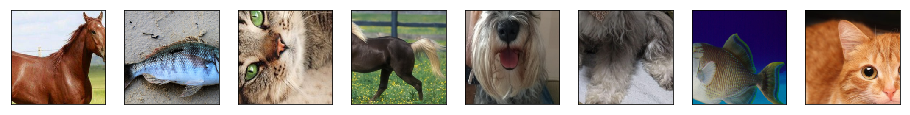

In [31]:
# exibe as imagens do dataset de test
show_dataset(dataloaders['test'])

Pred. [0 0 0 0 0 0 0 0]
Label [0 1 2 3 2 3 0 1]


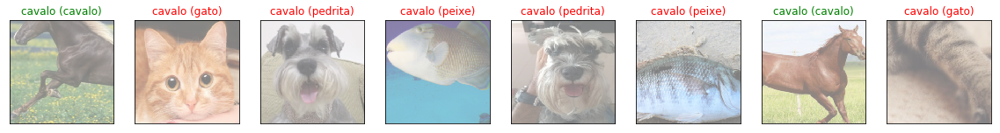

In [32]:
# obtem um lote de imagens de teste
dataiter = iter(dataloaders['test'])
data, target = dataiter.next()
images = data.numpy()

# get sample outputs
output = model(data)

# convert output probabilities to predicted class
_, preds_tensor = torch.max(output, 1)
preds = np.squeeze(preds_tensor.numpy())
print(f"Pred. {preds}")
print(f"Label {target.numpy()}")

fig = plt.figure(figsize=(20, 20))
for idx in np.arange(len(images)):
    img = images[idx] #/ 2 + 0.5
    ax = fig.add_subplot(1, len(images), idx+1, xticks=[], yticks=[])
    ax.imshow(np.transpose(img, (1, 2, 0)))
    ax.set_title("{} ({})".format(class_names[preds[idx]], class_names[target[idx]]), 
                 color=('g' if preds[idx]==target[idx].item() else 'r'))

# Aumentando as imagens da base

In [34]:
# All images are resized to 224 x 224 and normalized
# Only training images receive further augmentation
dataset_transforms = {
    'all': transforms.Compose([
        transforms.Resize(size=(224, 224)),
        #transforms.RandomResizedCrop(224),
        transforms.ToTensor()
        #transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)) # normaliza os pixels para 0..1
        #transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ]),
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(p=0.2),
        transforms.RandomRotation(20),
        transforms.RandomAffine(degrees=5, translate=(0.1, 0.1), scale=(1.0, 1.1), shear=5, resample=False, fillcolor=0),
        #transforms.RandomApply([transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1)], p=0.5),
        transforms.ToTensor()
    ]),
    'test': transforms.Compose([
        transforms.Resize(size=(224, 224)),
        transforms.ToTensor()
    ]),    
}

dataset_dir = "datasets/animais"
image_datasets = {x: datasets.ImageFolder(os.path.join(dataset_dir, x), dataset_transforms[x]) for x in ['train', 'test', 'all']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=batch_size, shuffle=False if x == 'all' else True, num_workers=4) for x in ['train', 'test', 'all']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'test', 'all']}

class_names = image_datasets['train'].classes
n_classes = len(class_names)

print(f"Qtd de total de imagens: {dataset_sizes['all']}")
print(f"Qtd de imagens de treinamento: {dataset_sizes['train']}")
print(f"Qtd de imagens de teste: {dataset_sizes['test']}")
print(f"Classes: {class_names}")

Qtd de total de imagens: 60
Qtd de imagens de treinamento: 52
Qtd de imagens de teste: 8
Classes: ['cavalo', 'gato', 'pedrita', 'peixe']


### Exibe algumas das imagens aumentadas

/home/dalifreire/anaconda3/envs/cnn_hello_world/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


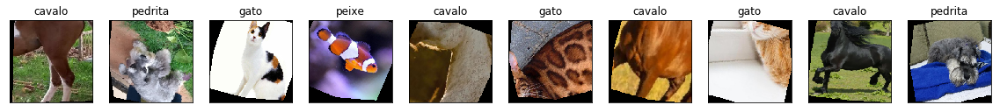

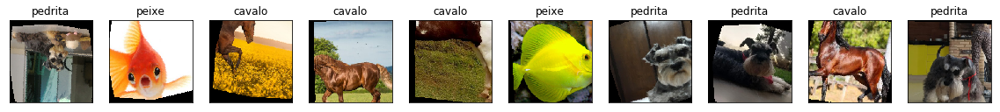

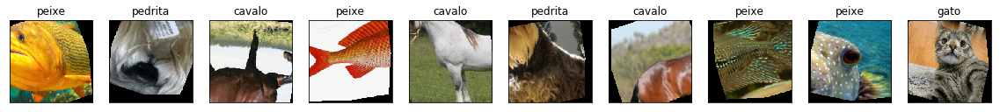

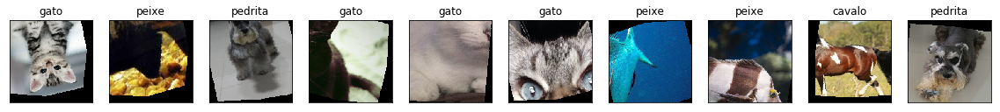

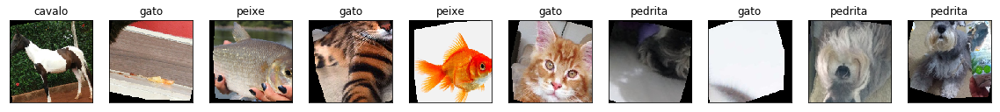

...

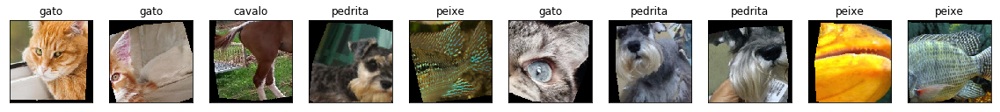

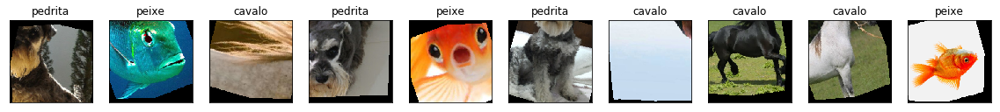

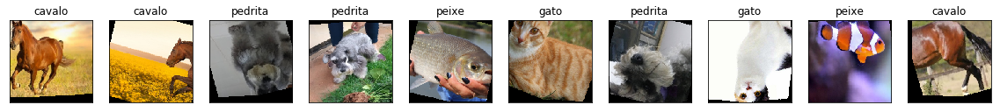

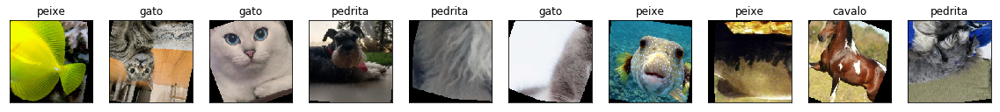

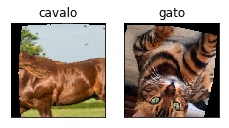

In [35]:
# obtem 10 lotes das imagens aumentadas
for i in range(10):
    
    # obtem um lote das imagens aumentadas
    for batch_i, (data, target) in enumerate(dataloaders['train']):
        #data, target = next(iter(dataloaders['train'])) 
        show_dataset_batch(data, target)
        

### Realiza um novo treinamento com a base aumentada

In [ ]:
model = Net()
train_cnn(augmentation_times=10)


Epoch 1/1
----------
Processando 1º lote de 10 imagens (total = 52)...
Processando 2º lote de 10 imagens (total = 52)...
Processando 3º lote de 10 imagens (total = 52)...
Processando 4º lote de 10 imagens (total = 52)...
Processando 5º lote de 10 imagens (total = 52)...
Processando 6º lote de 2 imagens (total = 52)...
Processando 1º lote de 10 imagens (total = 52)...
Processando 2º lote de 10 imagens (total = 52)...
Processando 3º lote de 10 imagens (total = 52)...
Processando 4º lote de 10 imagens (total = 52)...
Processando 5º lote de 10 imagens (total = 52)...
Processando 6º lote de 2 imagens (total = 52)...
Processando 1º lote de 10 imagens (total = 52)...
Processando 2º lote de 10 imagens (total = 52)...
Processando 3º lote de 10 imagens (total = 52)...
Processando 4º lote de 10 imagens (total = 52)...
Processando 5º lote de 10 imagens (total = 52)...
Processando 6º lote de 2 imagens (total = 52)...
Processando 1º lote de 10 imagens (total = 52)...
Processando 2º lote de 10 image